# GANs



## Introduction
This project explores the use of Generative Adversarial Networks (GANs) to create artwork in the style of Claude Monet. GANs are a type of deep learning model that consist of two main components: a generator, which produces images, and a discriminator, which evaluates whether the images are real or generated. The aim is to train a GAN that can generate between 7,000 and 10,000 Monet-style images.

#### Approach
To build the GAN, I will incorporate Graph Neural Networks (GNNs). GNNs are well-suited for handling graph-structured data by passing information across nodes and edges. This allows the model to capture complex relationships and structures, making GNNs ideal for tasks that involve connected or relational data—such as social networks, molecule modeling, or in this case, capturing artistic patterns and structures in images.

#### Evaluation
The performance of the generated images will be assessed using MiFID (Memorization Informed Fréchet Inception Distance). MiFID is an enhanced version of the standard FID metric, which compares the statistical similarity between real and generated images. It does this by analyzing features extracted from an Inception network. Importantly, MiFID also accounts for memorization of training data, which helps ensure the model isn't simply reproducing images it has seen before. A lower MiFID score indicates better performance.

In [1]:
import os, shutil, random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.utils import make_grid, save_image
from tqdm.notebook import tqdm

 ## Exploratory Data Analysis

Since all the data are in image format, it's better to create a dataset class to handle data import, manipulate and storage of the image dataset.

### Data Preprocessing
While preparing the dataset for training, I tried different image transformations. Most of them didn’t add much value and made things more complicated. After testing, I found that using just Gaussian Blur was enough for data augmentation. So, I kept the transformation process simple.

In [ ]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to a consistent size

    # Apply Gaussian blur for augmentation
    transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 3.0)),

    transforms.ToTensor(),  # Convert image to tensor
    transforms.Normalize(mean=[0.15, 0.15, 0.15], std=[0.5, 0.5, 0.5])
])

### Data Import
Create a custom PyTorch Dataset for loading images from a folder.

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.folder_path = folder_path
        self.transform = transform
        self.images = list(Path(folder_path).glob("*"))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        original_image = Image.open(image_path).convert('RGB')
        
        image = self.transform(original_image) if self.transform else original_image
        return image
    
    # this function is used to get the original image without any transformations
    def get_image(self, idx):
        image_path = self.images[idx]
        original_image = Image.open(image_path).convert('RGB')
        
        return original_image


Import the image dataset from the folder

In [ ]:
monet_dataset = ImageDataset('gan-getting-started/monet_jpg', transform)
photo_dataset = ImageDataset('gan-getting-started/photo_jpg', transform)

Check a sample tensor value from monet dataset

In [5]:
monet_dataset[0]

tensor([[[0.5392, 0.5784, 0.6098,  ..., 0.5392, 0.5471, 0.5471],
         [0.5627, 0.5941, 0.6255,  ..., 0.5392, 0.5706, 0.5784],
         [0.6098, 0.6176, 0.6412,  ..., 0.5314, 0.5863, 0.6098],
         ...,
         [0.6255, 0.6569, 0.6961,  ..., 0.3196, 0.3039, 0.3039],
         [0.6098, 0.6412, 0.6804,  ..., 0.3275, 0.3275, 0.3353],
         [0.5863, 0.6176, 0.6490,  ..., 0.3353, 0.3431, 0.3667]],

        [[0.7196, 0.7510, 0.7824,  ..., 0.6098, 0.6020, 0.5941],
         [0.7431, 0.7745, 0.8059,  ..., 0.6098, 0.6255, 0.6333],
         [0.7980, 0.8137, 0.8373,  ..., 0.6098, 0.6490, 0.6725],
         ...,
         [0.7824, 0.8137, 0.8529,  ..., 0.4294, 0.3902, 0.3824],
         [0.7588, 0.7902, 0.8294,  ..., 0.4294, 0.4137, 0.4137],
         [0.7353, 0.7667, 0.7980,  ..., 0.4373, 0.4294, 0.4373]],

        [[0.6176, 0.6569, 0.6882,  ..., 0.4529, 0.4373, 0.4216],
         [0.6490, 0.6804, 0.7118,  ..., 0.4529, 0.4608, 0.4608],
         [0.7196, 0.7275, 0.7510,  ..., 0.4451, 0.4843, 0.

Here, I found batch size 16 is the most efficient in terms of data loading

In [6]:
batch_size = 16

monet_loader = DataLoader(monet_dataset, batch_size=batch_size, shuffle=True)
photo_loader = DataLoader(photo_dataset, batch_size=batch_size, shuffle=True)

Check the size of the Monet Dataset to see if the number matches the files in the folder

In [7]:
print(f"Monet dataset size: {len(monet_loader.dataset)}")

Monet dataset size: 300


### Data Visualization
Here are the first 4 images from the dataset.

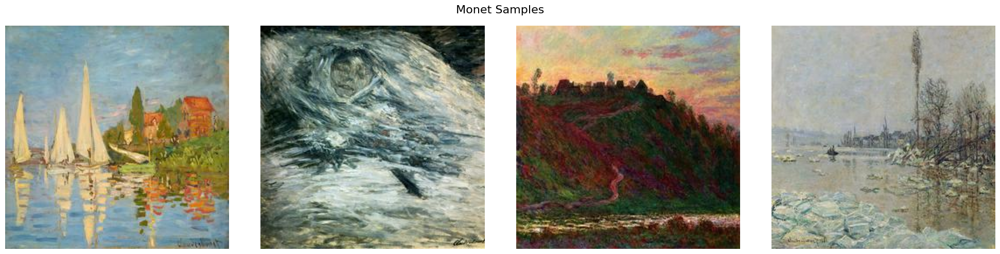

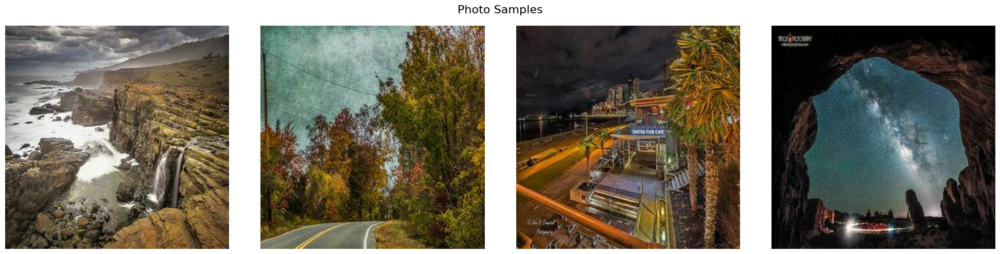

In [ ]:
def show_sample(dataset, n_images, title=None):
    plt.figure(figsize=(5 * n_images, 5))
    for i in range(n_images):
        image = dataset.get_image(i)
        plt.subplot(1, n_images, i + 1)
        plt.imshow(image)
        plt.axis('off')
    if title:
        plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

show_sample(monet_dataset, 4, title="Monet Samples")
show_sample(photo_dataset, 4, title="Photo Samples")

We can compare the original Monet image with the transformed one.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.29215688..1.6058824].


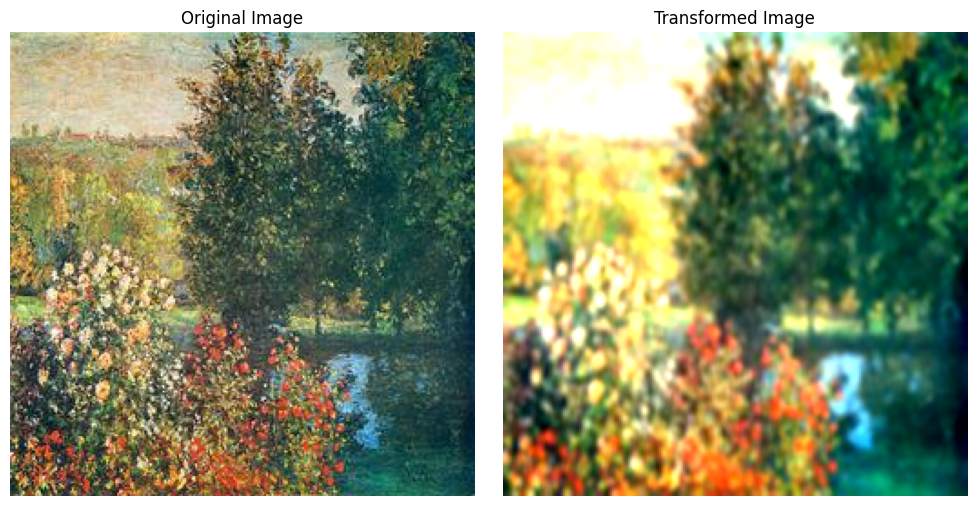

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.26078433..1.7].


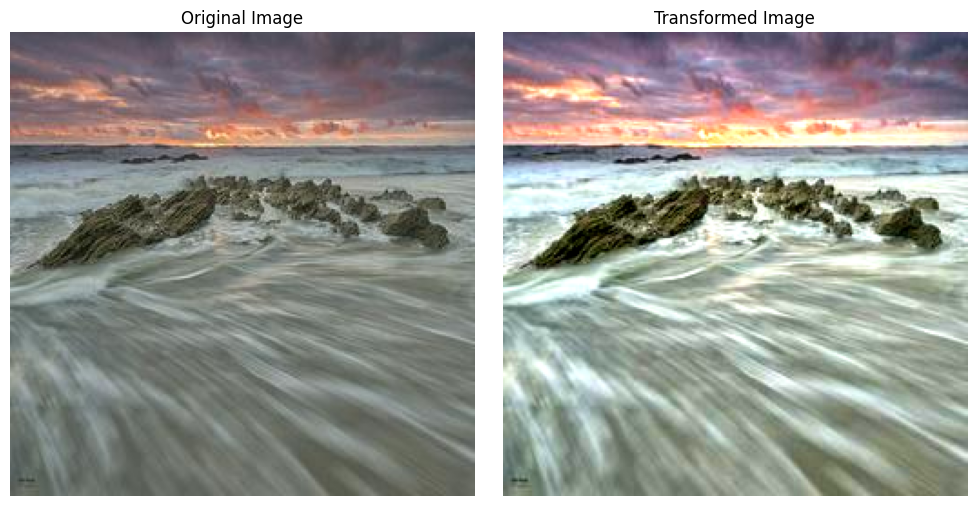

In [9]:

def compare_image_versions(index, dataset):
    transformed_img = dataset[index]
    original_img = dataset.get_image(index)

    transformed_img = np.squeeze(transformed_img)
    original_img = np.squeeze(original_img)

    _, axes = plt.subplots(1, 2, figsize=(10, 5))

    for ax in axes:
        ax.axis('off')

    axes[0].imshow(original_img)
    axes[0].set_title("Original Image")

    axes[1].imshow(transformed_img.permute(1, 2, 0))
    axes[1].set_title("Transformed Image")

    plt.tight_layout()
    plt.show()

random_index = random.randint(0, len(monet_dataset) - 1)
compare_image_versions(index=random_index, dataset=monet_dataset)
compare_image_versions(index=random_index, dataset=photo_dataset)

## Model Building
Here, I define a WGNN model for the task.
A WGNN is a type of Graph Neural Network (GNN) that includes both a Generator and a Discriminator. This setup allows the model to be trained to generate images in the style of Monet.

One of the key ideas behind the architecture is to design the Generator to be more complex than the Discriminator. If the Discriminator is too strong early on, it can quickly outperform the Generator, causing the Generator’s loss to stabilize too soon and hindering training progress.



Define the hyperparameters. Make sure the device can support M1 apple silicon and cuda

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu")
Tensor = torch.cuda.FloatTensor if torch.cuda.is_available() else torch.Tensor

print(f"Using {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
print(f"PyTorch version: {torch.__version__}")
print(f"Tensor Type: {Tensor}")

# Hyperparameters
lr = 2e-4
total_epochs = 100
log_interval = 10



Using mps
PyTorch version: 2.6.0
Tensor Type: <class 'torch.Tensor'>


The **Discriminator** is a relatively simple convolutional network composed of several convolutional and transposed convolutional layers. It processes input images and outputs a single-channel feature map to classify images as either real or generated (fake).

On the other hand, the **Generator** is a deeper and more complex network. It includes an input layer, an encoder, a stack of 9 residual blocks, and a decoder, designed to generate high-quality images in Monet’s style. The generator transforms input noise or images into Monet-like images that aim to fool the discriminator.

This architectural choice reflects a common GAN design principle: making the generator more expressive than the discriminator. Without this balance, the discriminator can quickly overpower the generator, leading to early convergence and poor generative performance.



In [11]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        in_channels = 3
        base_filters = 64

        self.net = nn.Sequential(
            nn.Conv2d(in_channels, base_filters, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            self._conv_block(base_filters, base_filters * 2, 4, 2, 1),
            self._conv_block(base_filters * 2, base_filters * 4, 4, 2, 1),
            self._conv_block(base_filters * 4, base_filters * 8, 4, 2, 1),
            self._deconv_block(base_filters * 8, base_filters * 4, 3, 2, 1, 1),
            self._deconv_block(base_filters * 4, base_filters * 2, 3, 2, 1, 1),
            self._deconv_block(base_filters * 2, base_filters, 3, 2, 1, 1),
            nn.Conv2d(base_filters, 1, kernel_size=3, stride=2, padding=1)
        )

    def _conv_block(self, in_ch, out_ch, k, s, p):
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, k, s, p, bias=False),
            nn.InstanceNorm2d(out_ch, affine=True),
            nn.LeakyReLU(0.2),
        )

    def _deconv_block(self, in_ch, out_ch, k, s, p, op):
        return nn.Sequential(
            nn.ConvTranspose2d(in_ch, out_ch, k, s, p, op, bias=False),
            nn.InstanceNorm2d(out_ch, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        return self.net(x)

class Generator(nn.Module):
    def __init__(self, num_res_blocks=9):
        super(Generator, self).__init__()

        input_channels = 3
        gen_filters = 64

        self.input_layer = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_channels, gen_filters, kernel_size=7, stride=1, padding=0),
            nn.InstanceNorm2d(gen_filters),
            nn.ReLU(inplace=True)
        )

        self.encoder = nn.Sequential(
            self._down_block(gen_filters, gen_filters * 2),
            self._down_block(gen_filters * 2, gen_filters * 4)
        )

        self.res_blocks = nn.Sequential(
            *[ResBlock(gen_filters * 4) for _ in range(num_res_blocks)]
        )

        self.decoder = nn.Sequential(
            self._up_block(gen_filters * 4, gen_filters * 2),
            self._up_block(gen_filters * 2, gen_filters)
        )

        self.output_layer = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(gen_filters, input_channels, kernel_size=7, stride=1, padding=0),
            nn.Tanh()
        )

    def _down_block(self, in_ch, out_ch):
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def _up_block(self, in_ch, out_ch):
        return nn.Sequential(
            nn.ConvTranspose2d(in_ch, out_ch, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.input_layer(x)
        x = self.encoder(x)
        x = self.res_blocks(x)
        x = self.decoder(x)
        return self.output_layer(x)

class ResBlock(nn.Module):
    def __init__(self, channels):
        super(ResBlock, self).__init__()
        self.sequence = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(channels, channels, 3),
            nn.InstanceNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(channels, channels, 3),
            nn.InstanceNorm2d(channels)
        )

    def forward(self, x):
        return x + self.sequence(x)


### Model Initialization and Loss Functions
For training the models, three loss functions are used:

* Mean Squared Error (MSE) is used as the GAN loss, helping the Generator produce outputs that the Discriminator classifies as real.

* L1 Loss is used for both the cycle consistency loss and identity loss, which are common in style transfer or cycle-consistent GAN architectures.



In [ ]:
gan_loss = nn.MSELoss().to(device)
cycle_loss = nn.L1Loss().to(device)
identity_loss = nn.L1Loss().to(device)


In [13]:
G = Generator()
D = Discriminator()

G = G.to(device)
D = D.to(device)

### Optimizers

For optimization, the RMSprop optimizer was used for both the Generator and Discriminator. It was chosen for its stability and adaptive learning capabilities, which help the models converge more smoothly during training.

In [ ]:
optimizer_G = torch.optim.RMSprop(G.parameters(), lr=lr)
optimizer_D = torch.optim.RMSprop(D.parameters(), lr=lr)

### Image Visualization Function
This function visualizes images before and after training the generator, allowing observation of the generator's progress over time.

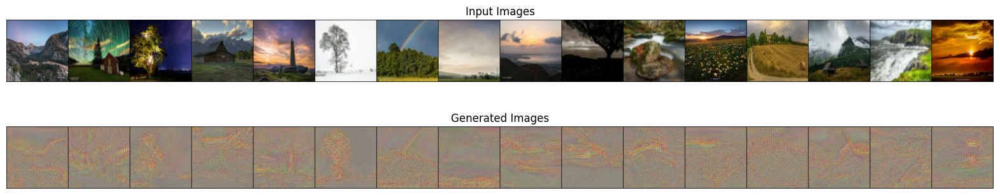

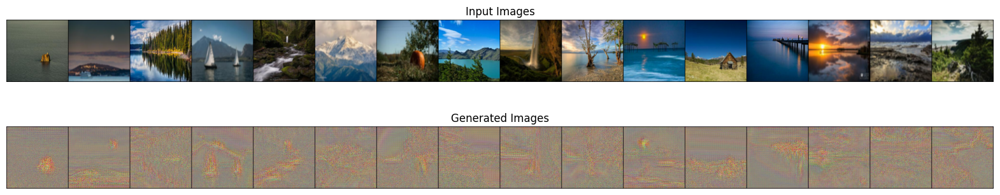

In [15]:
def visualize_samples(input_batch):
    G.eval()

    input_tensor = input_batch.type(Tensor)
    output_tensor = G(input_batch).detach()

    num_images = input_batch.size(0)
    input_grid = make_grid(input_tensor, nrow=num_images, normalize=True)
    output_grid = make_grid(output_tensor, nrow=num_images, normalize=True)

    _, axes = plt.subplots(2, 1, figsize=(20, 4))

    axes[0].imshow(input_grid.permute(1, 2, 0).cpu())
    axes[0].set_title("Input Images")
    axes[0].axis('off')

    axes[1].imshow(output_grid.permute(1, 2, 0).cpu())
    axes[1].set_title("Generated Images")
    axes[1].axis('off')

    plt.show()


real_X = next(iter(photo_loader))
real_Y = next(iter(photo_loader))
visualize_samples(real_X.to(device))
visualize_samples(real_Y.to(device))

## Model Training

The training process involves updating both the generator and discriminator with distinct loss components:

* **Generator Training:**
  The generator's loss is composed of two main parts:

  * **Identity Loss:** Encourages the generator to preserve the content and structure of the input image.
  * **GAN Loss:** Measures how well the generator fools the discriminator.
    These two losses are combined in different proportions and used together during backpropagation to update the generator.

* **Discriminator Training:**
  The discriminator’s loss also has two components:

  * **Real Image Misclassification Loss:** The loss incurred when real paintings are incorrectly classified as fake.
  * **Fake Image Misclassification Loss:** The loss incurred when generated (fake) paintings are incorrectly classified as real.
    Together, these losses guide the discriminator to better distinguish between real and generated images.



  0%|          | 0/100 [00:00<?, ?it/s]

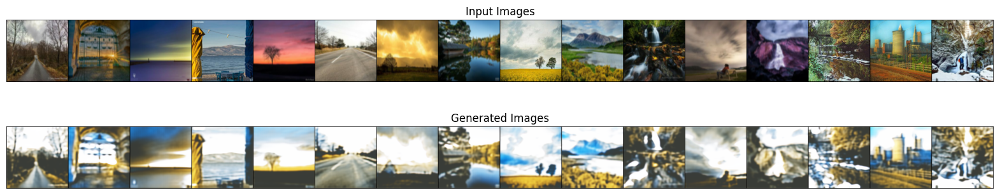

Epoch 10/100
Generator Loss: 1.2643
Discriminator Loss: -0.0876


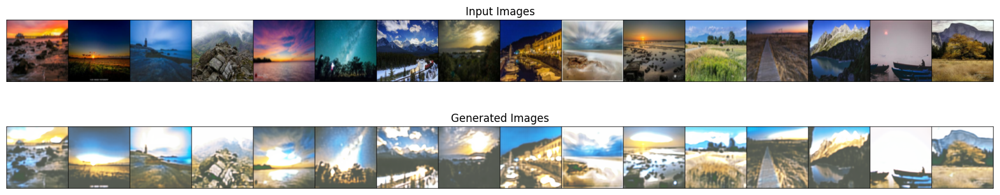

Epoch 20/100
Generator Loss: 1.1819
Discriminator Loss: -0.0906


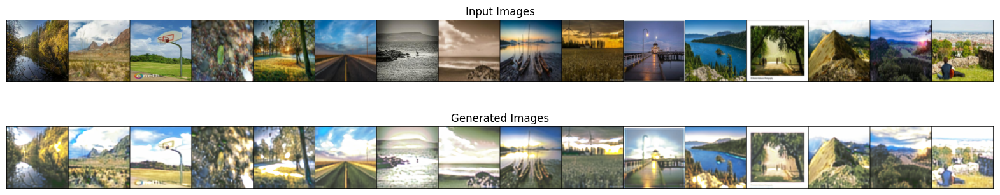

Epoch 30/100
Generator Loss: 0.9627
Discriminator Loss: -0.0836


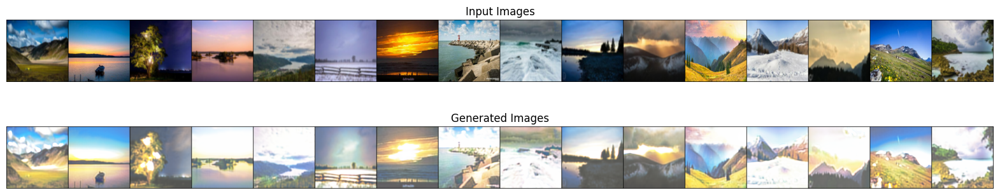

Epoch 40/100
Generator Loss: 0.9664
Discriminator Loss: -0.0537


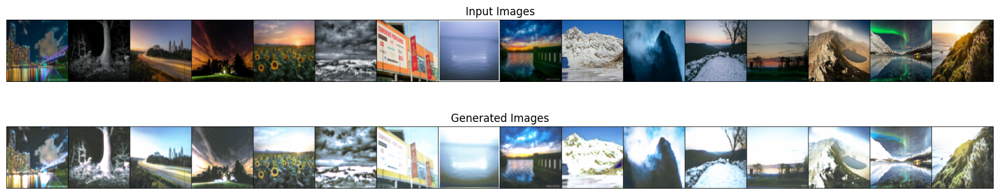

Epoch 50/100
Generator Loss: 0.9702
Discriminator Loss: -0.0946


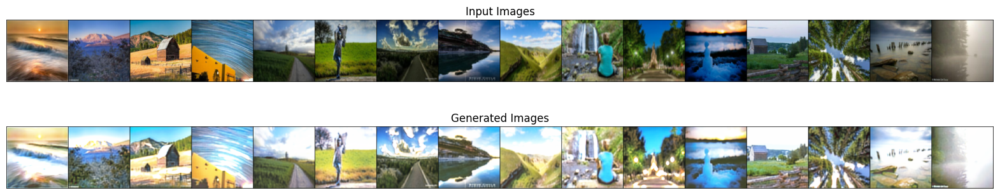

Epoch 60/100
Generator Loss: 0.9762
Discriminator Loss: -0.0618


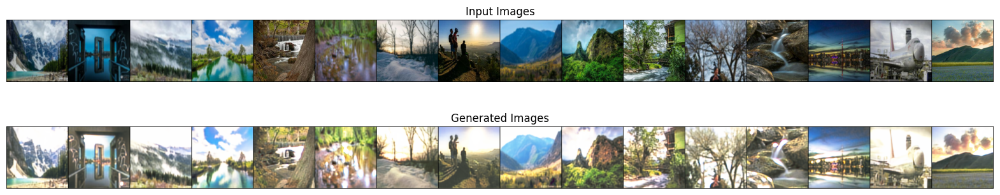

Epoch 70/100
Generator Loss: 0.8412
Discriminator Loss: -0.0900


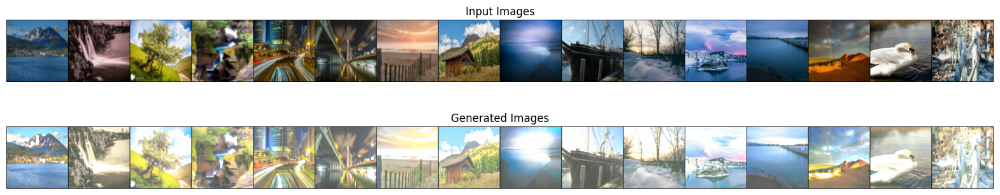

Epoch 80/100
Generator Loss: 0.8836
Discriminator Loss: -0.0939


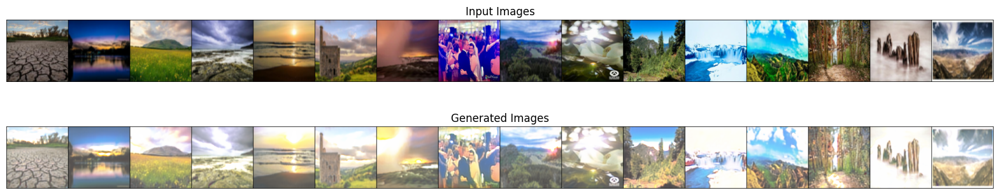

Epoch 90/100
Generator Loss: 0.8257
Discriminator Loss: -0.0952


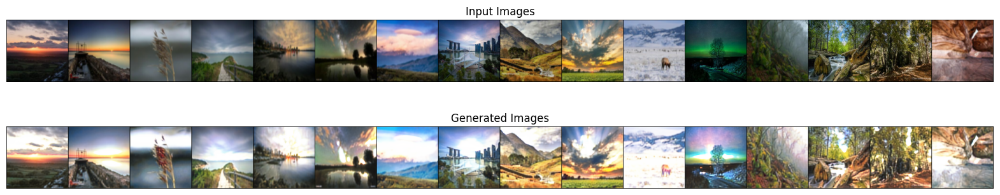

Epoch 100/100
Generator Loss: 0.8313
Discriminator Loss: -0.0945


In [ ]:
CRITIC_STEPS = 5
CLIP_VALUE = 0.01
ID_LOSS_WEIGHT = 5
gen_loss_log = []
disc_loss_log = []

for epoch in tqdm(range(total_epochs)):
    for i, (batch_photo, batch_monet) in enumerate(zip(photo_loader, monet_loader)):

        batch_photo = batch_photo.to(device)
        batch_monet = batch_monet.to(device)

        for _ in range(CRITIC_STEPS):
            optimizer_D.zero_grad()
            monet_fake = G(batch_photo)
            disc_real_out = D(batch_monet).reshape(-1)
            disc_fake_out = D(monet_fake.detach()).reshape(-1)
            disc_loss = -(torch.mean(disc_real_out) - torch.mean(disc_fake_out))
            disc_loss.backward(retain_graph=True)
            optimizer_D.step()
            for param in D.parameters():
                param.data.clamp_(-CLIP_VALUE, CLIP_VALUE)

        optimizer_G.zero_grad()
        gen_disc_out = D(monet_fake).reshape(-1)
        gen_adv_loss = -torch.mean(gen_disc_out)
        id_loss = identity_loss(monet_fake, batch_photo)
        gen_total_loss = gen_adv_loss + ID_LOSS_WEIGHT * id_loss
        gen_total_loss.backward()
        optimizer_G.step()

    if (epoch + 1) % log_interval == 0:
        sample_photo, _ = next(iter(zip(photo_loader, monet_loader)))
        visualize_samples(sample_photo.to(device))
        print(f'Epoch {epoch + 1}/{total_epochs}')
        print(f'Generator Loss: {gen_total_loss.item():.4f}')
        gen_loss_log.append(gen_total_loss.item())
        print(f'Discriminator Loss: {disc_loss.item():.4f}')
        disc_loss_log.append(disc_loss.item())


### Loss History

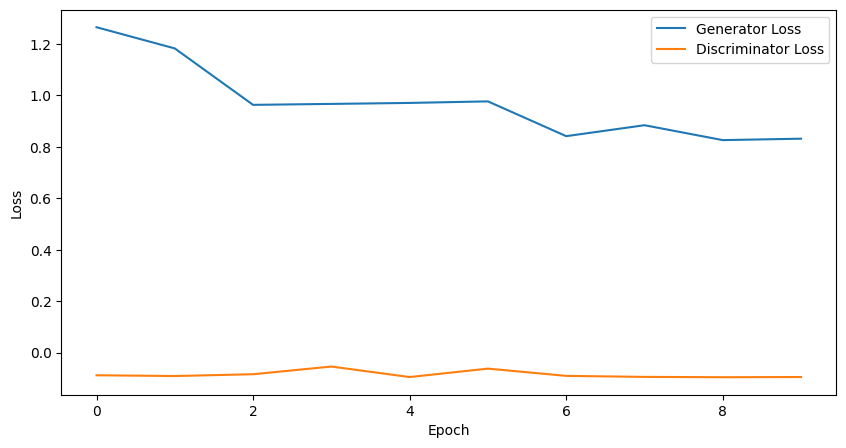

In [17]:
def display_training_curves(gen_log, disc_log):
    plt.figure(figsize=(10, 5))
    plt.plot(gen_log, label='Generator Loss')
    plt.plot(disc_log, label='Discriminator Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

display_training_curves(gen_loss_log, disc_loss_log)

The plot shows that the generator loss is approaching 1, while the discriminator loss is nearing 0 — a positive indication that the model is learning effectively.

We can also visually confirm this progress: the generated images gradually transform from realistic photos to painting-like outputs as training progresses through the epochs.

## Submission

In [18]:
output_dir = 'generated_outputs'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

G.eval()

for idx, photo_batch in enumerate(photo_loader):
    photo_batch = photo_batch.to(device)
    with torch.no_grad():
        stylized_batch = G(photo_batch)

    for img_idx, styled_img in enumerate(stylized_batch):
        filename = f'style_output_{idx * batch_size + img_idx}.png'
        save_path = os.path.join(output_dir, filename)
        save_image(styled_img, save_path)

print(f"Generated images saved to: {output_dir}")

shutil.make_archive("outputs_archive", 'zip', output_dir)


Generated images saved to: generated_outputs


'outputs_archive.zip'

## Conclusion

In this notebook, I developed a GAN model to generate images in the style of Monet using a WGNN architecture, which consists of a generator and a discriminator. The generator aims to produce images that can fool the discriminator, while the discriminator learns to distinguish between real and generated images.

The training process utilized MSE and L1 loss functions, along with the RMSprop optimizer. The model was trained for 100 epochs, and the resulting images were saved for submission.